# Objective : To build a feature of recommendation system to support a music app.

### ===================================================================================

### DESCRIPTION ABOUT COLUMNS :

#### 1: user_id: Unique identifier for each user in the dataset.
#### 2: song_id: Unique identifier for each song in the dataset.
#### 3: spotify_popularity: Popularity score of the song on Spotify.
#### 4: track_name: Name or title of the song.
#### 5: danceability: A measure of how suitable the song is for dancing based on a combination of musical elements, like tempo, rhythm, and beat. 
#### 6: energy: A measure of the song's energy level and its intensity. Energy is also measured on a scale of 0 (low) to 100 (high).
#### 7: key: A key is the main group of pitches, or notes, that form the harmonic foundation of a piece of music.
#### 8: mode: The modality of the song, often represented as major (1) or minor (0).It provides a theoretical framework for the melody.
#### 9: acousticness: A measure of how acoustic or non-electronic the song is.
#### 10: instrumentalness: A measure of how instrumental or non-vocal the song is.
#### 11: valence: A measure of the song's positivity or happiness.
#### 12: tempo: The tempo or beats per minute (BPM) of the song.
#### 13: time_signature: The time signature of the song's musical structure.
#### 14: track_genre: The genre or musical category to which the song belongs.
#### 15: Rating: User ratings or scores for the song.   add serial numbers for all poits

Reference: https://www.software.com/src/explore-the-data-behind-your-most-productive-music-for-coding

### =======================================================================================

## Step 1 : Import Necessary Libraries 

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Step 2 : Load the Dataset

In [2]:
df = pd.read_csv("Music_Dataset.csv")

In [3]:
Music_data = df.copy()

In [4]:
Music_data

,user_id,song_id,spotify_popularity,track_name,duration_ms,explicit,danceability,energy,key,loudness,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,Review,Rating
0,3720277.0,32192.0,87.0,Comedy,230666.0,False,0.676,0.4610,1.0,-6.746,...,0.1430,0.032200,0.000001,0.3580,0.7150,87.917,4.0,acoustic,i think i actually under-rate ok computer if a...,5.0
1,3720277.0,6801.0,45.0,Ghost - Acoustic,149610.0,False,0.420,0.1660,1.0,-17.235,...,0.0763,0.924000,0.000006,0.1010,0.2670,77.489,4.0,acoustic,i get why radiohead rub a lot of people the wr...,5.0
2,3720277.0,31643.0,62.0,To Begin Again,210826.0,False,0.438,0.3590,0.0,-9.734,...,0.0557,0.210000,0.000000,0.1170,0.1200,76.332,4.0,acoustic,i would like to think i am good about not lett...,4.5
3,3720277.0,1864239.0,72.0,Can't Help Falling In Love,201933.0,False,0.266,0.0596,0.0,-18.515,...,0.0363,0.905000,0.000071,0.1320,0.1430,181.740,3.0,acoustic,there are radiohead devotees like there were o...,4.0
4,3720277.0,38804.0,73.0,Hold On,198853.0,False,0.618,0.4430,2.0,-9.681,...,0.0526,0.469000,0.000000,0.0829,0.1670,119.949,4.0,acoustic,i wrote a shining excellent review for this al...,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6996,3728657.0,1822821.0,61.0,Phantoms of Mortem Tales,335293.0,False,0.128,0.9540,5.0,-4.753,...,0.0567,0.000004,0.128000,0.1670,0.1830,147.166,4.0,black-metal,abbey road is a perfect medley of life death l...,4.5
6997,3728700.0,4222632.0,62.0,Bergagasten,310213.0,False,0.565,0.8520,0.0,-3.869,...,0.0340,0.001290,0.001140,0.0962,0.5100,124.960,4.0,black-metal,this is one of my favorite albums by the beatl...,4.5
6998,3728700.0,19250.0,53.0,The Pentagram Burns,384946.0,False,0.406,0.9770,2.0,-10.303,...,0.0809,0.007940,0.049700,0.9530,0.0594,125.004,4.0,black-metal,1 who the hell wants to own abbey road on cd? ...,NaN
6999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
Music_data.head()

,user_id,song_id,spotify_popularity,track_name,duration_ms,explicit,danceability,energy,key,loudness,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,Review,Rating
0,3720277.0,32192.0,87.0,Comedy,230666.0,False,0.676,0.4610,1.0,-6.746,...,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4.0,acoustic,i think i actually under-rate ok computer if a...,5.0
1,3720277.0,6801.0,45.0,Ghost - Acoustic,149610.0,False,0.420,0.1660,1.0,-17.235,...,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4.0,acoustic,i get why radiohead rub a lot of people the wr...,5.0
2,3720277.0,31643.0,62.0,To Begin Again,210826.0,False,0.438,0.3590,0.0,-9.734,...,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4.0,acoustic,i would like to think i am good about not lett...,4.5
3,3720277.0,1864239.0,72.0,Can't Help Falling In Love,201933.0,False,0.266,0.0596,0.0,-18.515,...,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3.0,acoustic,there are radiohead devotees like there were o...,4.0
4,3720277.0,38804.0,73.0,Hold On,198853.0,False,0.618,0.4430,2.0,-9.681,...,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4.0,acoustic,i wrote a shining excellent review for this al...,5.0


In [6]:
Music_data.tail()

,user_id,song_id,spotify_popularity,track_name,duration_ms,explicit,danceability,energy,key,loudness,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,Review,Rating
6996,3728657.0,1822821.0,61.0,Phantoms of Mortem Tales,335293.0,False,0.128,0.954,5.0,-4.753,...,0.0567,0.000004,0.12800,0.1670,0.1830,147.166,4.0,black-metal,abbey road is a perfect medley of life death l...,4.5
6997,3728700.0,4222632.0,62.0,Bergagasten,310213.0,False,0.565,0.852,0.0,-3.869,...,0.0340,0.001290,0.00114,0.0962,0.5100,124.960,4.0,black-metal,this is one of my favorite albums by the beatl...,4.5
6998,3728700.0,19250.0,53.0,The Pentagram Burns,384946.0,False,0.406,0.977,2.0,-10.303,...,0.0809,0.007940,0.04970,0.9530,0.0594,125.004,4.0,black-metal,1 who the hell wants to own abbey road on cd? ...,NaN
6999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Step 3 : Data Understanding

In [7]:
Music_data.count()

user_id               6997
song_id               6997
spotify_popularity    6997
track_name            6997
duration_ms           6997
explicit              6997
danceability          6997
energy                6997
key                   6997
loudness              6997
mode                  6997
speechiness           6997
acousticness          6997
instrumentalness      6997
liveness              6997
valence               6997
tempo                 6997
time_signature        6997
track_genre           6997
Review                6991
Rating                6798
dtype: int64

In [8]:
for i,col in  enumerate(Music_data.columns):
    print(i,col)

0 user_id
1 song_id
2 spotify_popularity
3 track_name
4 duration_ms
5 explicit
6 danceability
7 energy
8 key
9 loudness
10 mode
11 speechiness
12 acousticness
13 instrumentalness
14 liveness
15 valence
16 tempo
17 time_signature
18 track_genre
19 Review
20 Rating


In [9]:
#Now let’s remove some columns which we won’t be using to build our recommender system.

Music_data.drop(Music_data.columns[[4,5,9,11,14,19]], axis=1, inplace=True)

In [10]:
Music_data

,user_id,song_id,spotify_popularity,track_name,danceability,energy,key,mode,acousticness,instrumentalness,valence,tempo,time_signature,track_genre,Rating
0,3720277.0,32192.0,87.0,Comedy,0.676,0.4610,1.0,0.0,0.032200,0.000001,0.7150,87.917,4.0,acoustic,5.0
1,3720277.0,6801.0,45.0,Ghost - Acoustic,0.420,0.1660,1.0,1.0,0.924000,0.000006,0.2670,77.489,4.0,acoustic,5.0
2,3720277.0,31643.0,62.0,To Begin Again,0.438,0.3590,0.0,1.0,0.210000,0.000000,0.1200,76.332,4.0,acoustic,4.5
3,3720277.0,1864239.0,72.0,Can't Help Falling In Love,0.266,0.0596,0.0,1.0,0.905000,0.000071,0.1430,181.740,3.0,acoustic,4.0
4,3720277.0,38804.0,73.0,Hold On,0.618,0.4430,2.0,1.0,0.469000,0.000000,0.1670,119.949,4.0,acoustic,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6996,3728657.0,1822821.0,61.0,Phantoms of Mortem Tales,0.128,0.9540,5.0,1.0,0.000004,0.128000,0.1830,147.166,4.0,black-metal,4.5
6997,3728700.0,4222632.0,62.0,Bergagasten,0.565,0.8520,0.0,0.0,0.001290,0.001140,0.5100,124.960,4.0,black-metal,4.5
6998,3728700.0,19250.0,53.0,The Pentagram Burns,0.406,0.9770,2.0,1.0,0.007940,0.049700,0.0594,125.004,4.0,black-metal,NaN
6999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
for i,col in  enumerate(Music_data.columns):
    print(i,col)

0 user_id
1 song_id
2 spotify_popularity
3 track_name
4 danceability
5 energy
6 key
7 mode
8 acousticness
9 instrumentalness
10 valence
11 tempo
12 time_signature
13 track_genre
14 Rating


In [12]:
Music_data.count()

user_id               6997
song_id               6997
spotify_popularity    6997
track_name            6997
danceability          6997
energy                6997
key                   6997
mode                  6997
acousticness          6997
instrumentalness      6997
valence               6997
tempo                 6997
time_signature        6997
track_genre           6997
Rating                6798
dtype: int64

In [13]:
#Number of unique tracks.

Music_data['track_name'].nunique()

5656

In [14]:
#Number of unique users.

Music_data['user_id'].nunique()

665

In [15]:
Music_data['track_name'].value_counts()

All Star                                18
killer                                  15
Living Dead Girl                        14
Don't Shoot Me Santa                    12
Dragula                                 12
                                        ..
Très magnifique                          1
Freguês da Meia Noite (Instrumental)     1
Follow me                                1
African Man                              1
The Pentagram Burns                      1
Name: track_name, Length: 5656, dtype: int64

In [16]:
Music_data['track_genre'].unique()

array(['acoustic', nan, 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal'], dtype=object)

In [17]:
Music_data.shape

(7001, 15)

In [18]:
Music_data.dtypes

user_id               float64
song_id               float64
spotify_popularity    float64
track_name             object
danceability          float64
energy                float64
key                   float64
mode                  float64
acousticness          float64
instrumentalness      float64
valence               float64
tempo                 float64
time_signature        float64
track_genre            object
Rating                float64
dtype: object

## Step 4 : Data Preprocessing

In [19]:
#CHECK NULL VALUES 
Music_data.isnull().sum()

user_id                 4
song_id                 4
spotify_popularity      4
track_name              4
danceability            4
energy                  4
key                     4
mode                    4
acousticness            4
instrumentalness        4
valence                 4
tempo                   4
time_signature          4
track_genre             4
Rating                203
dtype: int64

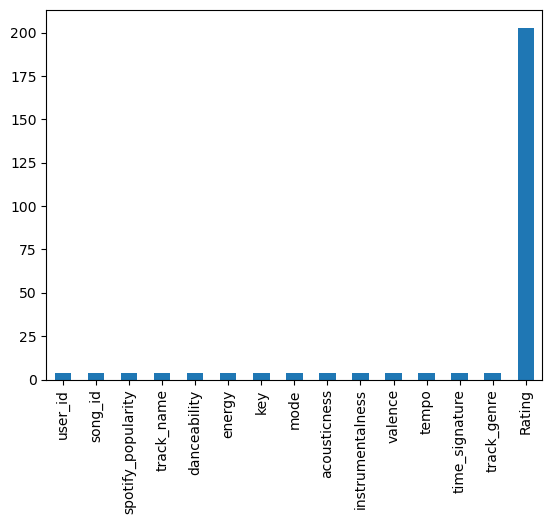

In [20]:
Music_data.isnull().sum().plot.bar()
plt.show()

In [21]:
# We have null values in the data set, here we replace null values with (mean and mode)

# For objective type
mode_value = Music_data['track_genre'].mode().values[0]
Music_data['track_genre'].fillna(mode_value, inplace=True)

mode_value =Music_data['track_name'].mode().values[0]
Music_data['track_name'].fillna(mode_value, inplace=True)


# For interger and float type
Music_data['user_id'].fillna(332.476503, inplace=True)
Music_data['song_id'].fillna(1506.321240, inplace=True)
Music_data['spotify_popularity'].fillna(50.222667, inplace=True)
Music_data['danceability'].fillna(0.502244, inplace=True)
Music_data['energy'].fillna(0.628266, inplace=True)
Music_data['key'].fillna(5.363013, inplace=True)
Music_data['mode'].fillna(0.612977, inplace=True)
Music_data['acousticness'].fillna(0.311448, inplace=True)
Music_data['instrumentalness'].fillna(0.251876, inplace=True)
Music_data['valence'].fillna(0.418645, inplace=True)
Music_data['tempo'].fillna(121.186366, inplace=True)
Music_data['time_signature'].fillna(3.873517, inplace=True)
Music_data['Rating'].fillna(4.330538, inplace=True)

In [22]:
Music_data.isnull().sum()

user_id               0
song_id               0
spotify_popularity    0
track_name            0
danceability          0
energy                0
key                   0
mode                  0
acousticness          0
instrumentalness      0
valence               0
tempo                 0
time_signature        0
track_genre           0
Rating                0
dtype: int64

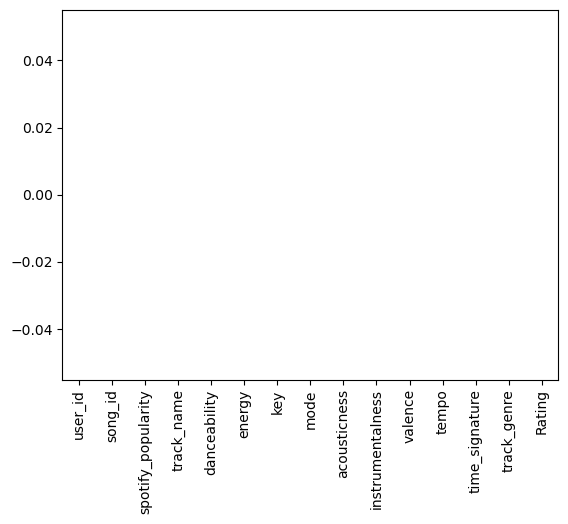

In [23]:
Music_data.isnull().sum().plot.bar()
plt.show()

We can see from the above plot that there are no any null values present in our dataset.

In [24]:
#CHECK THE DUPLICATES
Music_data.duplicated().sum()

3

In [25]:
Music_data = Music_data.drop_duplicates()

In [26]:
Music_data.duplicated().sum()

0

In [27]:
Music_data

,user_id,song_id,spotify_popularity,track_name,danceability,energy,key,mode,acousticness,instrumentalness,valence,tempo,time_signature,track_genre,Rating
0,3720277.0,32192.0,87.0,Comedy,0.676,0.4610,1.0,0.0,0.032200,0.000001,0.7150,87.917,4.0,acoustic,5.000000
1,3720277.0,6801.0,45.0,Ghost - Acoustic,0.420,0.1660,1.0,1.0,0.924000,0.000006,0.2670,77.489,4.0,acoustic,5.000000
2,3720277.0,31643.0,62.0,To Begin Again,0.438,0.3590,0.0,1.0,0.210000,0.000000,0.1200,76.332,4.0,acoustic,4.500000
3,3720277.0,1864239.0,72.0,Can't Help Falling In Love,0.266,0.0596,0.0,1.0,0.905000,0.000071,0.1430,181.740,3.0,acoustic,4.000000
4,3720277.0,38804.0,73.0,Hold On,0.618,0.4430,2.0,1.0,0.469000,0.000000,0.1670,119.949,4.0,acoustic,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6994,3728657.0,1835872.0,56.0,Antichrist Siege Machine,0.193,0.9900,1.0,1.0,0.000001,0.848000,0.0380,134.067,4.0,black-metal,4.000000
6995,3728700.0,4105239.0,29.0,The Scope Of Obsession,0.573,0.9760,1.0,0.0,0.000046,0.022200,0.3150,114.020,4.0,black-metal,3.000000
6996,3728657.0,1822821.0,61.0,Phantoms of Mortem Tales,0.128,0.9540,5.0,1.0,0.000004,0.128000,0.1830,147.166,4.0,black-metal,4.500000
6997,3728700.0,4222632.0,62.0,Bergagasten,0.565,0.8520,0.0,0.0,0.001290,0.001140,0.5100,124.960,4.0,black-metal,4.500000


In [28]:
#CHECK INFINITE VALUES
Music_data.iloc[Music_data.values==np.inf].sum()

user_id               0.0
song_id               0.0
spotify_popularity    0.0
track_name            0.0
danceability          0.0
energy                0.0
key                   0.0
mode                  0.0
acousticness          0.0
instrumentalness      0.0
valence               0.0
tempo                 0.0
time_signature        0.0
track_genre           0.0
Rating                0.0
dtype: float64

In [29]:
#DATASET INFORMATION
Music_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6998 entries, 0 to 6998
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   user_id             6998 non-null   float64
 1   song_id             6998 non-null   float64
 2   spotify_popularity  6998 non-null   float64
 3   track_name          6998 non-null   object 
 4   danceability        6998 non-null   float64
 5   energy              6998 non-null   float64
 6   key                 6998 non-null   float64
 7   mode                6998 non-null   float64
 8   acousticness        6998 non-null   float64
 9   instrumentalness    6998 non-null   float64
 10  valence             6998 non-null   float64
 11  tempo               6998 non-null   float64
 12  time_signature      6998 non-null   float64
 13  track_genre         6998 non-null   object 
 14  Rating              6998 non-null   float64
dtypes: float64(13), object(2)
memory usage: 874.8+ KB


In [30]:
Music_data.describe()

,user_id,song_id,spotify_popularity,danceability,energy,key,mode,acousticness,instrumentalness,valence,tempo,time_signature,Rating
count,6.998000e+03,6.998000e+03,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000
mean,3.724545e+06,2.040881e+06,50.222667,0.502244,0.628266,5.363013,0.612977,0.311448,0.251876,0.418645,121.186366,3.873517,4.330538
std,4.463748e+04,1.833838e+06,16.610422,0.183160,0.288064,3.551575,0.487069,0.359503,0.369823,0.268494,30.598005,0.466861,0.944681
min,3.324765e+02,1.200000e+02,0.000000,0.000000,0.001440,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
25%,3.722204e+06,7.938300e+04,41.000000,0.381000,0.406000,2.000000,0.000000,0.005215,0.000000,0.185000,97.501500,4.000000,4.000000
50%,3.725674e+06,1.841530e+06,52.000000,0.516000,0.700000,6.000000,1.000000,0.113000,0.001140,0.382000,120.008500,4.000000,4.500000
75%,3.728205e+06,4.139380e+06,62.000000,0.638000,0.882000,9.000000,1.000000,0.639750,0.627000,0.637000,141.612000,4.000000,5.000000
max,3.734809e+06,5.336437e+06,98.000000,0.974000,1.000000,11.000000,1.000000,0.996000,0.993000,0.995000,220.081000,5.000000,5.000000


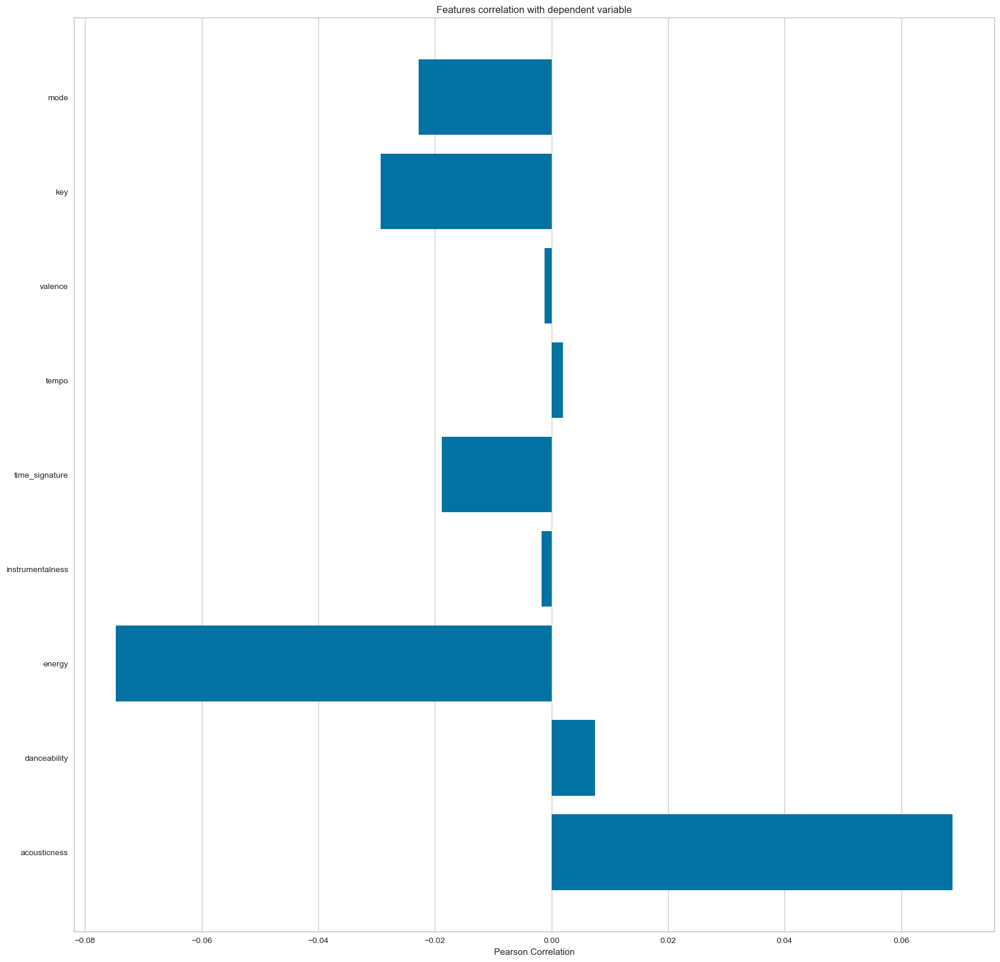

<AxesSubplot:title={'center':'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [31]:
#Feature Correlation with Dependent Variable

from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'time_signature', 'tempo', 'valence','key','mode']

X, y = Music_data[feature_names], Music_data['spotify_popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

### =======================================================================================

In [32]:
# Encode item IDs to integers
from sklearn.preprocessing import LabelEncoder
item_encoder = LabelEncoder()
Music_data['user_id'] = item_encoder.fit_transform(Music_data['user_id'])
Music_data['song_id'] = item_encoder.fit_transform(Music_data['song_id'])

In [33]:
Music_data.describe()

,user_id,song_id,spotify_popularity,danceability,energy,key,mode,acousticness,instrumentalness,valence,tempo,time_signature,Rating
count,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000,6998.000000
mean,333.238783,1506.137611,50.222667,0.502244,0.628266,5.363013,0.612977,0.311448,0.251876,0.418645,121.186366,3.873517,4.330538
std,226.960610,907.547645,16.610422,0.183160,0.288064,3.551575,0.487069,0.359503,0.369823,0.268494,30.598005,0.466861,0.944681
min,0.000000,0.000000,0.000000,0.000000,0.001440,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
25%,119.000000,683.250000,41.000000,0.381000,0.406000,2.000000,0.000000,0.005215,0.000000,0.185000,97.501500,4.000000,4.000000
50%,356.000000,1511.000000,52.000000,0.516000,0.700000,6.000000,1.000000,0.113000,0.001140,0.382000,120.008500,4.000000,4.500000
75%,546.000000,2279.000000,62.000000,0.638000,0.882000,9.000000,1.000000,0.639750,0.627000,0.637000,141.612000,4.000000,5.000000
max,665.000000,3178.000000,98.000000,0.974000,1.000000,11.000000,1.000000,0.996000,0.993000,0.995000,220.081000,5.000000,5.000000


## Step 5 : Data Visualization || EDA

In [34]:
# To find the pairwise correlation of all columns in the Dataframe,
Music_data.corr()

,user_id,song_id,spotify_popularity,danceability,energy,key,mode,acousticness,instrumentalness,valence,tempo,time_signature,Rating
user_id,1.000000,0.051205,0.005080,-0.412936,0.107560,-0.006787,-0.077486,-0.121034,0.333694,-0.384547,0.036491,-0.084930,0.040744
song_id,0.051205,1.000000,-0.323414,-0.029409,0.066058,-0.000567,0.027696,-0.046304,0.046352,-0.008793,0.025978,0.006889,0.003629
spotify_popularity,0.005080,-0.323414,1.000000,0.007512,-0.074719,-0.029264,-0.022788,0.068820,-0.001742,-0.001165,0.001989,-0.018834,-0.007232
danceability,-0.412936,-0.029409,0.007512,1.000000,0.067403,0.035512,-0.010884,-0.046754,-0.350294,0.620873,-0.087664,0.208545,0.009674
energy,0.107560,0.066058,-0.074719,0.067403,1.000000,0.058314,-0.050337,-0.833290,-0.313850,0.341520,0.233372,0.166912,0.077249
key,-0.006787,-0.000567,-0.029264,0.035512,0.058314,1.000000,-0.122768,-0.061337,-0.023520,0.055205,0.025447,0.025881,0.003900
mode,-0.077486,0.027696,-0.022788,-0.010884,-0.050337,-0.122768,1.000000,0.052222,-0.095254,-0.011189,0.023455,0.004076,-0.032774
acousticness,-0.121034,-0.046304,0.068820,-0.046754,-0.833290,-0.061337,0.052222,1.000000,0.290770,-0.245238,-0.204798,-0.149138,-0.071977
instrumentalness,0.333694,0.046352,-0.001742,-0.350294,-0.313850,-0.023520,-0.095254,0.290770,1.000000,-0.381230,-0.105051,-0.151672,0.000704
valence,-0.384547,-0.008793,-0.001165,0.620873,0.341520,0.055205,-0.011189,-0.245238,-0.381230,1.000000,0.061609,0.168946,0.032953


In [35]:
# Co-relation
numeric_columns = Music_data.select_dtypes(include=['number'])
correlation_matrix = numeric_columns.corr()

In [36]:
correlation_matrix

,user_id,song_id,spotify_popularity,danceability,energy,key,mode,acousticness,instrumentalness,valence,tempo,time_signature,Rating
user_id,1.000000,0.051205,0.005080,-0.412936,0.107560,-0.006787,-0.077486,-0.121034,0.333694,-0.384547,0.036491,-0.084930,0.040744
song_id,0.051205,1.000000,-0.323414,-0.029409,0.066058,-0.000567,0.027696,-0.046304,0.046352,-0.008793,0.025978,0.006889,0.003629
spotify_popularity,0.005080,-0.323414,1.000000,0.007512,-0.074719,-0.029264,-0.022788,0.068820,-0.001742,-0.001165,0.001989,-0.018834,-0.007232
danceability,-0.412936,-0.029409,0.007512,1.000000,0.067403,0.035512,-0.010884,-0.046754,-0.350294,0.620873,-0.087664,0.208545,0.009674
energy,0.107560,0.066058,-0.074719,0.067403,1.000000,0.058314,-0.050337,-0.833290,-0.313850,0.341520,0.233372,0.166912,0.077249
key,-0.006787,-0.000567,-0.029264,0.035512,0.058314,1.000000,-0.122768,-0.061337,-0.023520,0.055205,0.025447,0.025881,0.003900
mode,-0.077486,0.027696,-0.022788,-0.010884,-0.050337,-0.122768,1.000000,0.052222,-0.095254,-0.011189,0.023455,0.004076,-0.032774
acousticness,-0.121034,-0.046304,0.068820,-0.046754,-0.833290,-0.061337,0.052222,1.000000,0.290770,-0.245238,-0.204798,-0.149138,-0.071977
instrumentalness,0.333694,0.046352,-0.001742,-0.350294,-0.313850,-0.023520,-0.095254,0.290770,1.000000,-0.381230,-0.105051,-0.151672,0.000704
valence,-0.384547,-0.008793,-0.001165,0.620873,0.341520,0.055205,-0.011189,-0.245238,-0.381230,1.000000,0.061609,0.168946,0.032953


### Visualization for Correlation

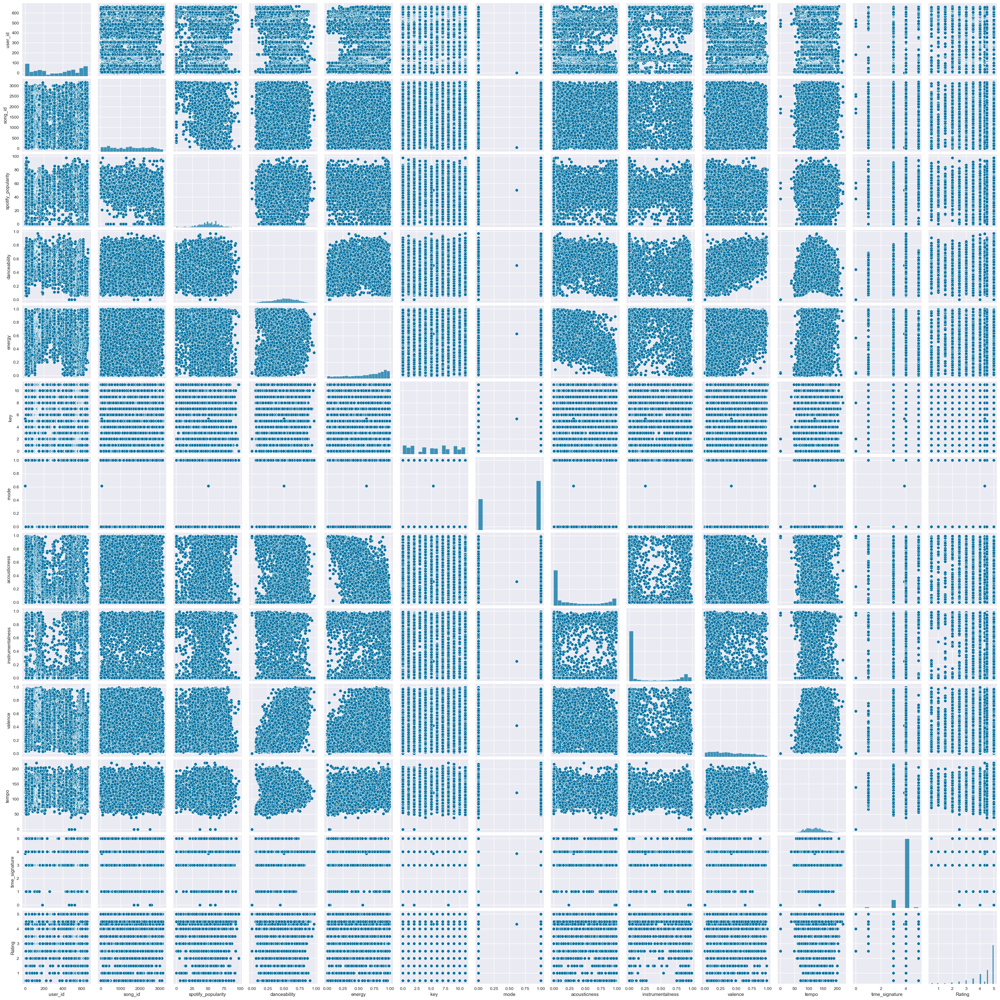

In [37]:
sns.set_style(style="darkgrid")
sns.pairplot(Music_data)

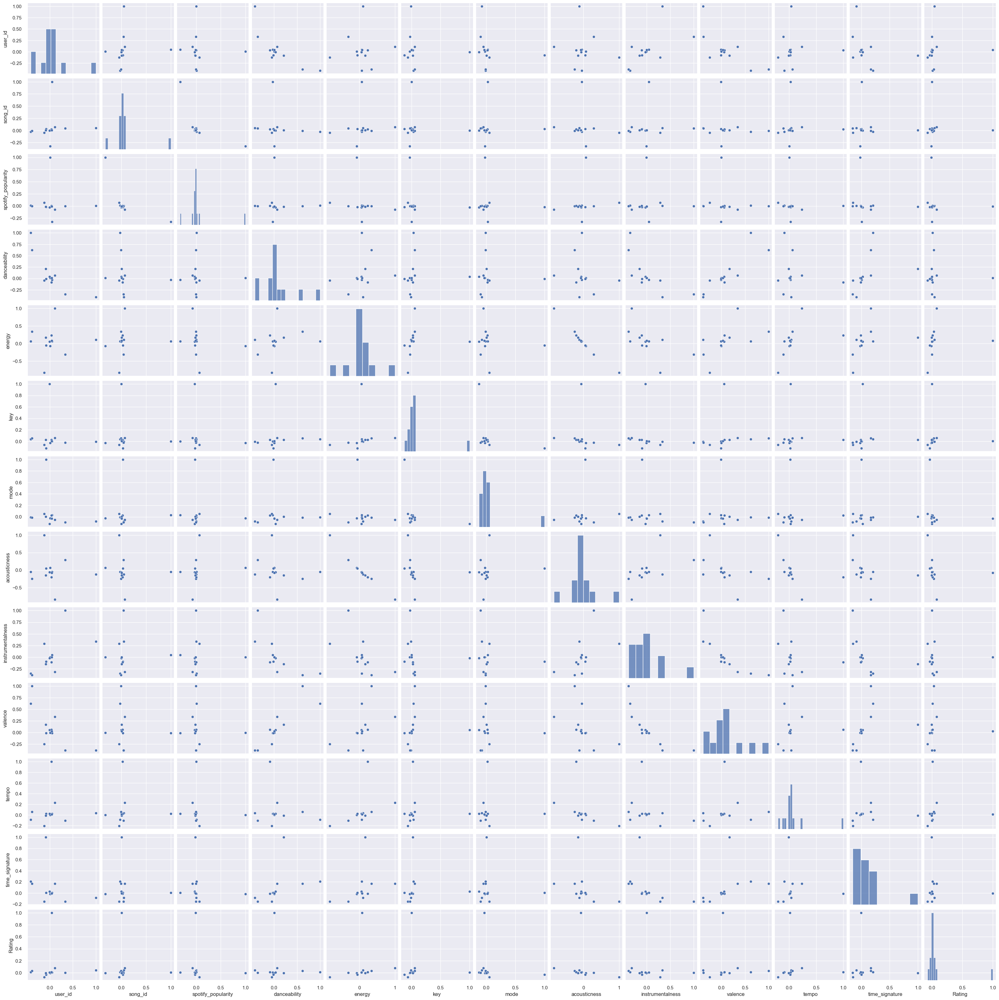

In [78]:
sns.set_style(style="darkgrid")
sns.pairplot(correlation_matrix)

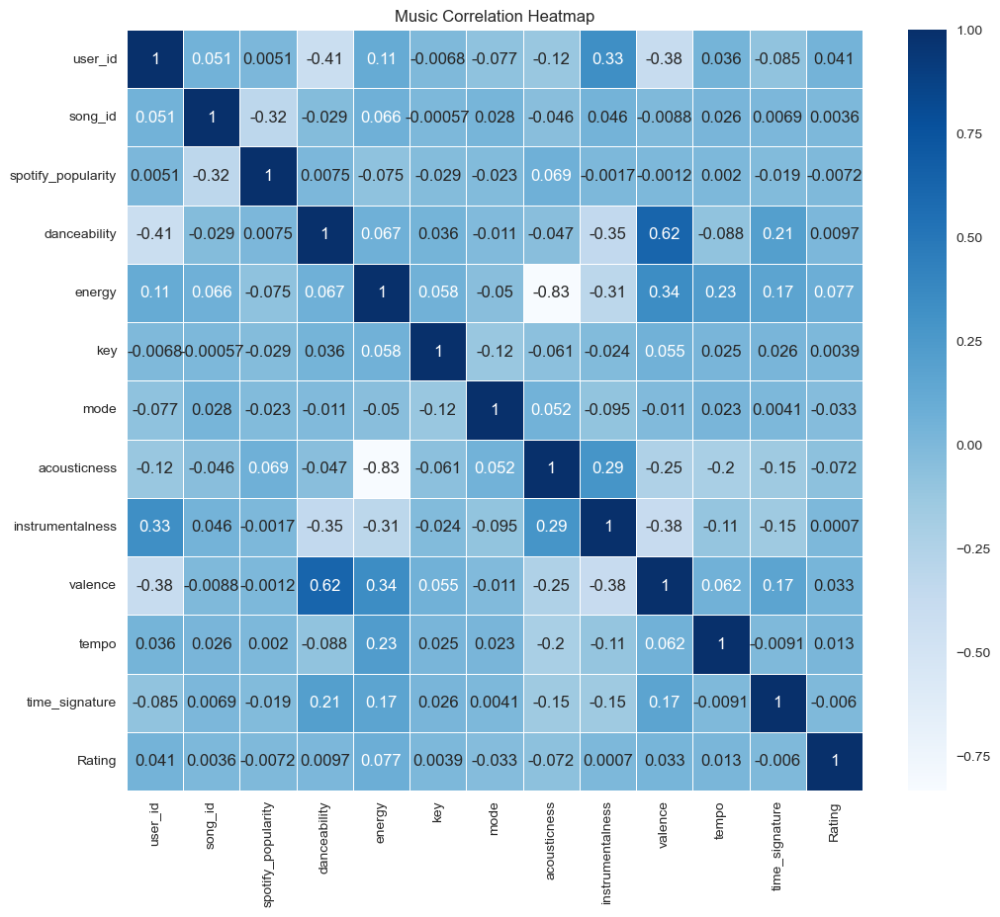

In [38]:
# Create a heatmap

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', linewidths=0.5)
plt.title('Music Correlation Heatmap')
plt.show()

### Boxplot for Outlier Detection

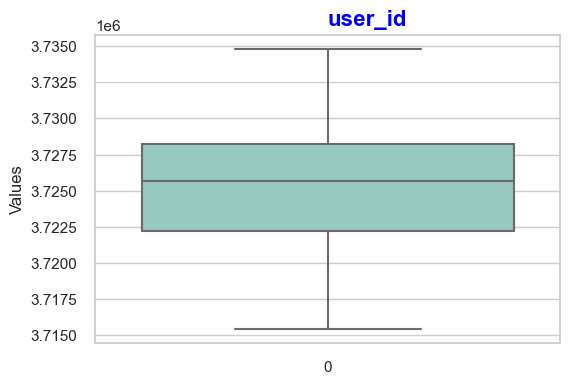

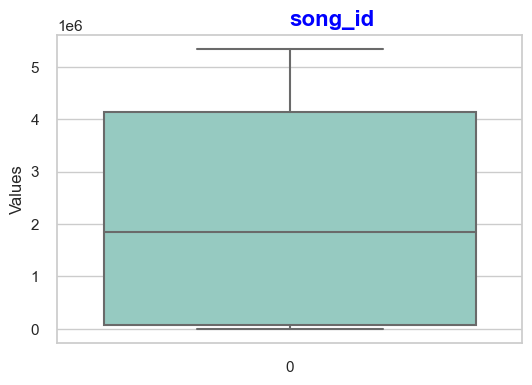

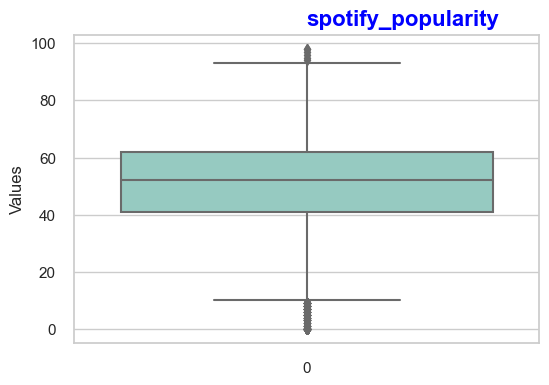

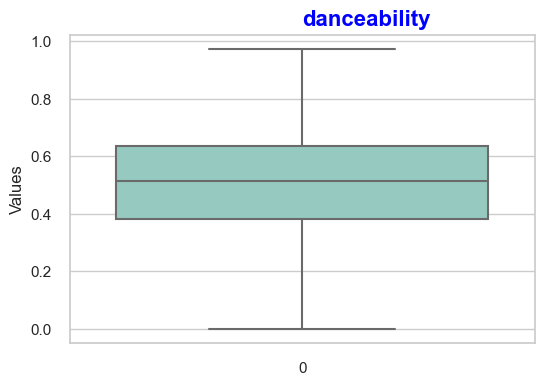

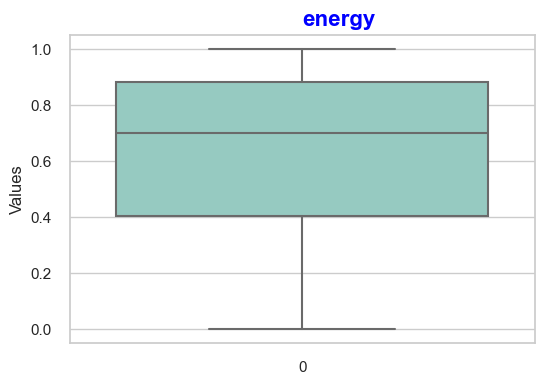

...

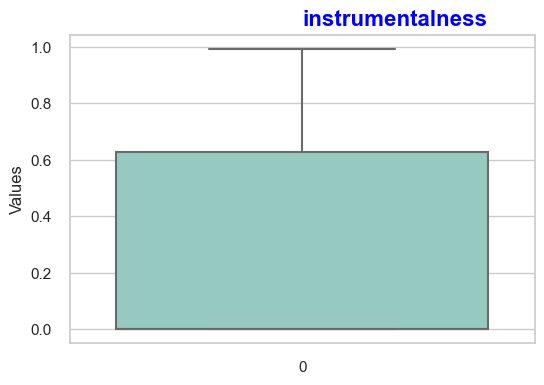

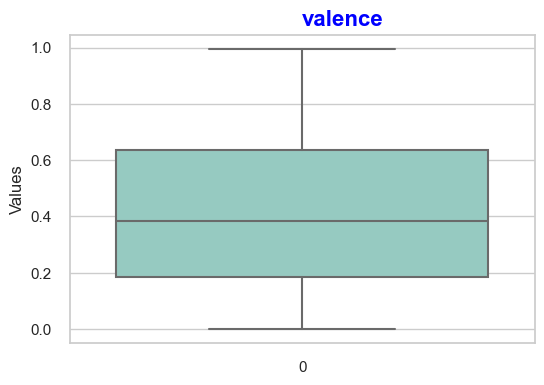

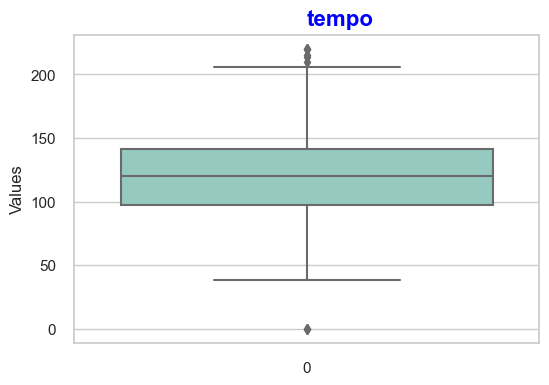

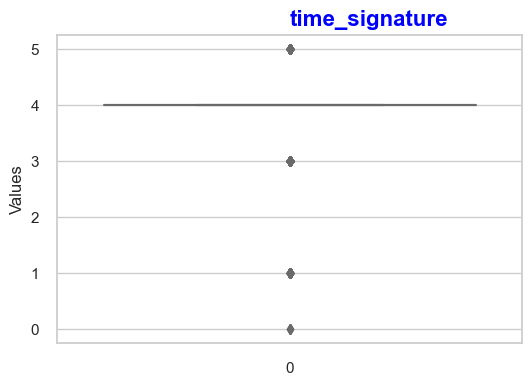

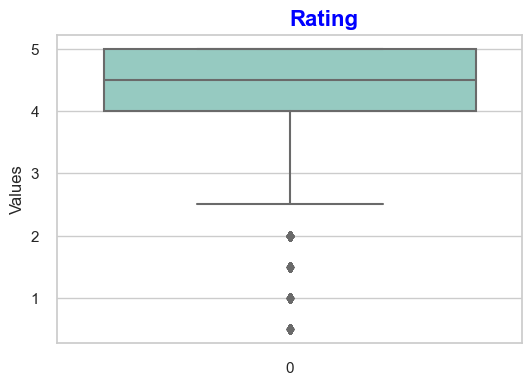

In [39]:
# The numeric columns to create box plots
numeric_columns = ['user_id', 'song_id', 'spotify_popularity', 'danceability', 'energy', 'key', 'mode', 'acousticness', 'instrumentalness', 'valence', 'tempo', 'time_signature', 'Rating']

sns.set(style="whitegrid")

for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=df[column], palette="Set3")
    plt.xlabel
    plt.ylabel("Values")
    plt.title

    # text and set its color
    plt.text(0.5, 1.05, column, transform=plt.gca().transAxes, fontsize=16, color='blue', weight='bold', va='center')

    plt.show()

### Density Visualization

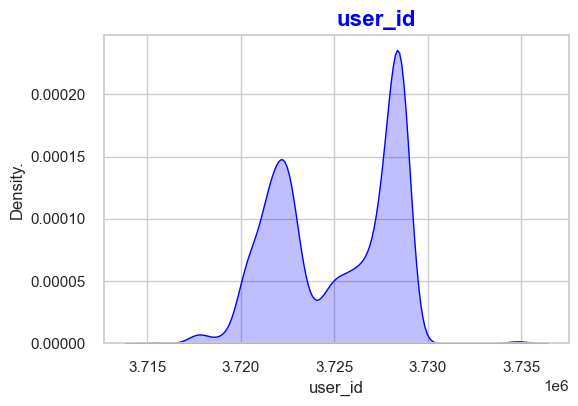

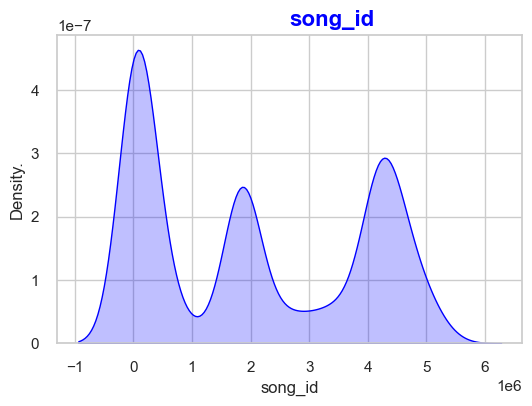

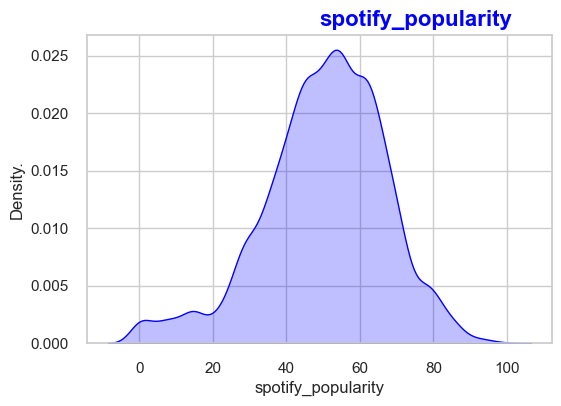

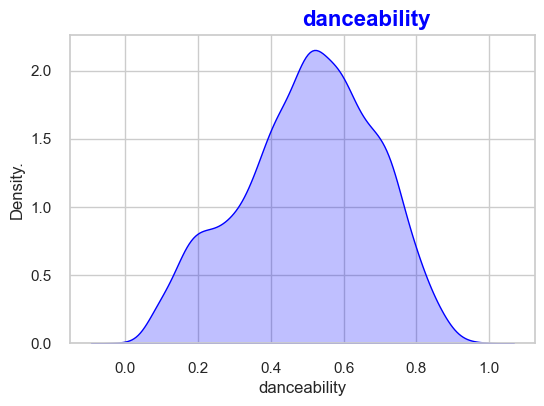

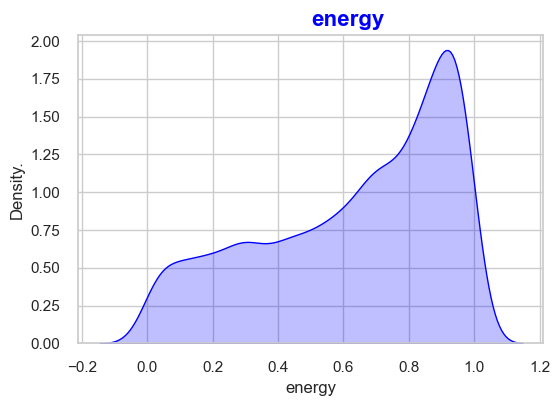

...

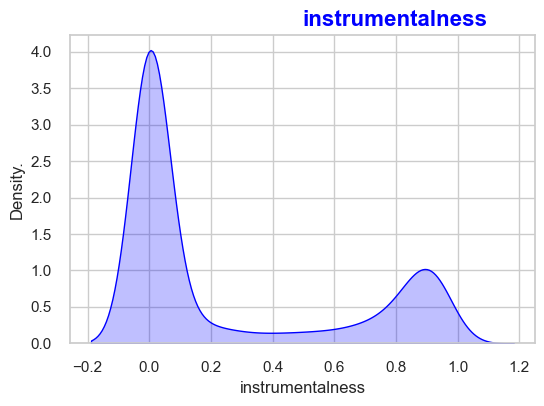

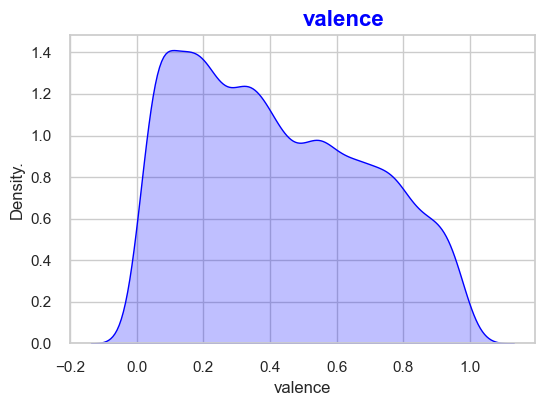

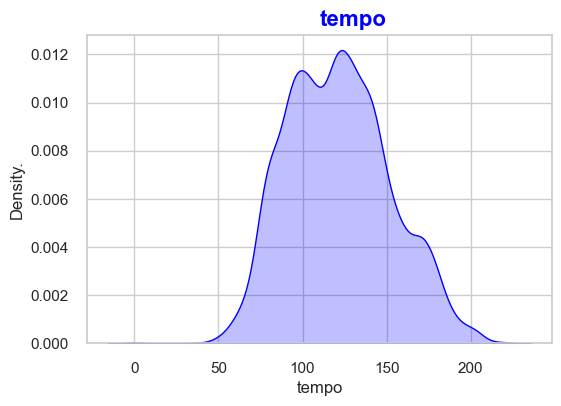

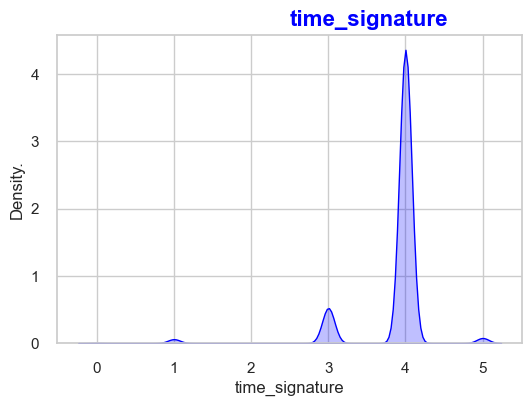

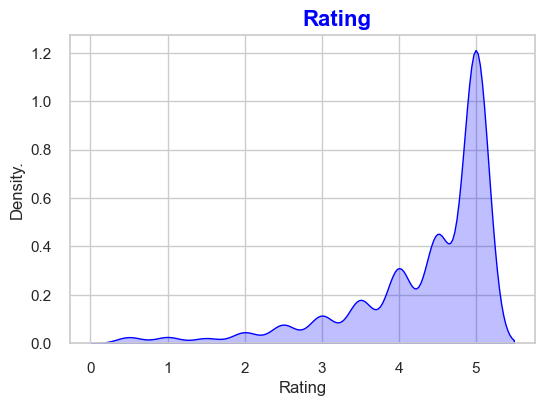

In [40]:
# The numeric columns to create density plots

numeric_columns = ['user_id', 'song_id', 'spotify_popularity', 'danceability', 'energy', 'key', 'mode', 'acousticness', 'instrumentalness', 'valence', 'tempo', 'time_signature', 'Rating']

sns.set(style="whitegrid")

for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(data=df[column], color='blue', shade=True)  # Create a density plot
    plt.xlabel
    plt.ylabel("Density.")
    plt.title

    # Text and set its color
    plt.text(0.5, 1.05, column, transform=plt.gca().transAxes, fontsize=16, color='blue', weight='bold', va='center')

    plt.show()

### Histogram Visualization

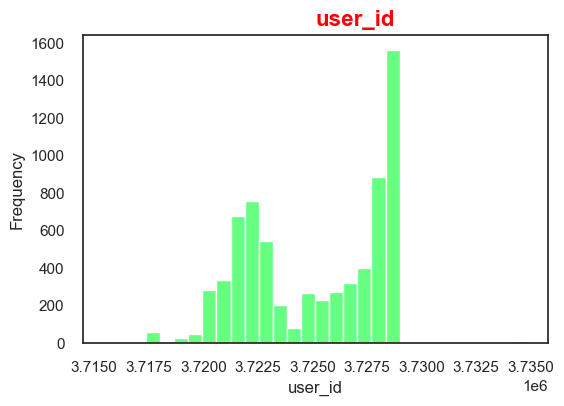

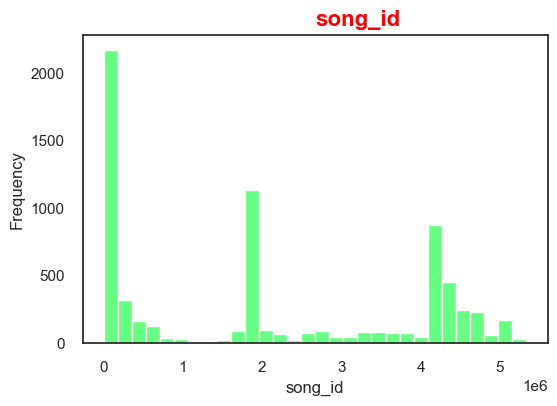

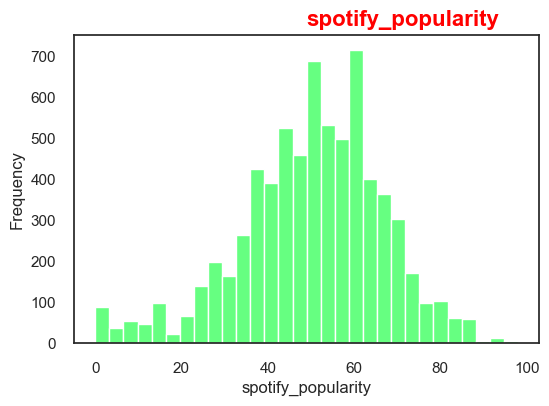

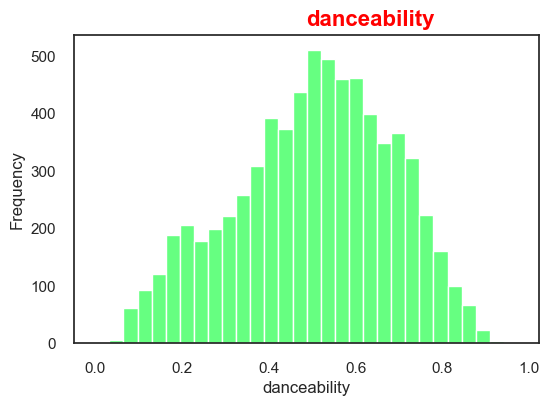

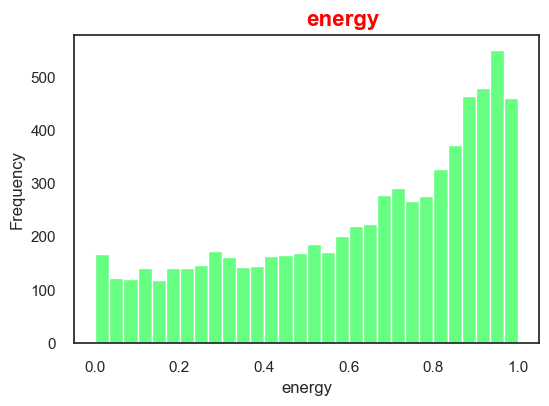

...

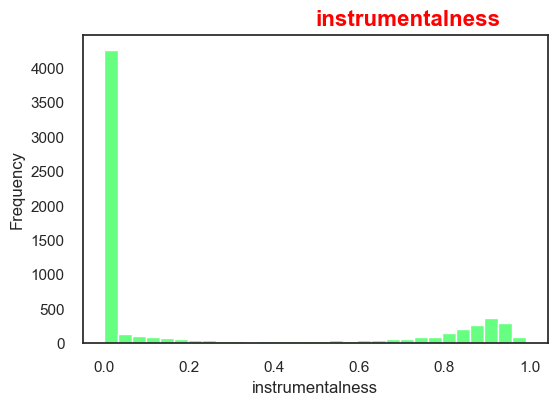

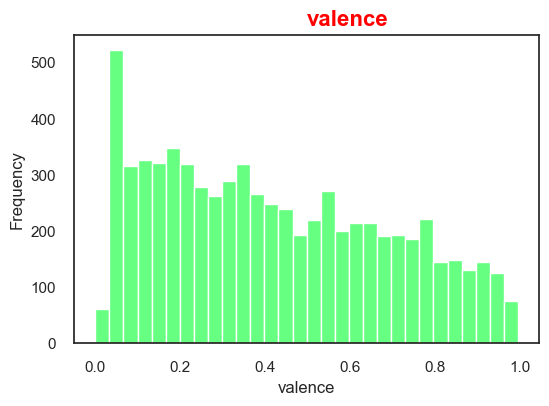

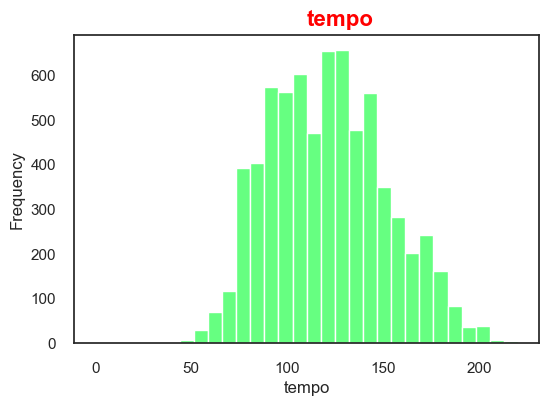

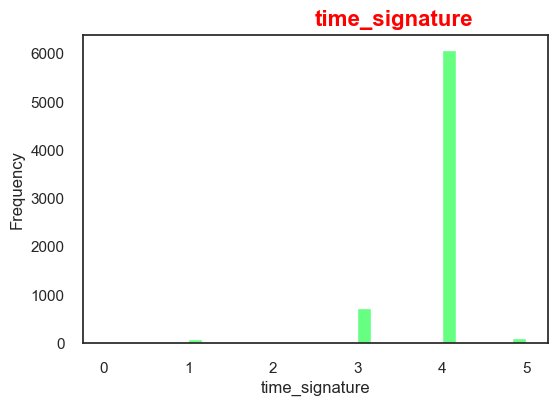

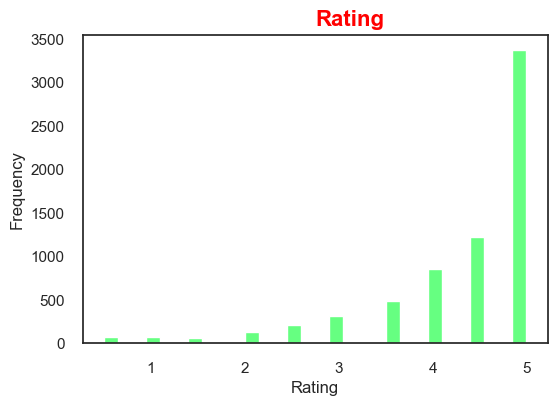

In [41]:
# The numeric columns to create histogram plots
numeric_columns = ['user_id', 'song_id', 'spotify_popularity', 'danceability', 'energy', 'key', 'mode', 'acousticness', 'instrumentalness', 'valence', 'tempo', 'time_signature', 'Rating']

sns.set(style="white")

for column in numeric_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(data=df[column], color='#33FF57', bins=30)
    plt.xlabel
    plt.ylabel("Frequency")
    plt.title

    plt.text(0.5, 1.05, column, transform=plt.gca().transAxes, fontsize=16, color='red', weight='bold', va='center')

    plt.show()

## Feature scaling

### In summary, feature scaling is an essential consideration during EDA, particularly when you intend to use machine learning algorithms that are sensitive to feature scales.

In [42]:
from sklearn.preprocessing import StandardScaler

# list of numeric columns
numeric_columns = ['spotify_popularity', 'danceability', 'energy', 'key', 'mode', 'acousticness', 'instrumentalness', 'valence', 'tempo', 'time_signature']

# Extract the numeric columns
data_numeric = Music_data[numeric_columns]

# Step 1: Initialize the StandardScaler
scaler = StandardScaler()

# Step 2: Fit the scaler to data and transform the data
data_scaled = scaler.fit_transform(data_numeric)

# Step 3: Replace the original data with the scaled data
Music_data[numeric_columns] = data_scaled

In [43]:
Music_data[numeric_columns]

,spotify_popularity,danceability,energy,key,mode,acousticness,instrumentalness,valence,tempo,time_signature
0,2.214270,0.948724,-0.580699,-1.228560,-1.258591,-0.776818,-0.681118,1.103844,-1.087383,0.270941
1,-0.314444,-0.449058,-1.604850,-1.228560,0.794653,1.704009,-0.681106,-0.564840,-1.428214,0.270941
2,0.709083,-0.350777,-0.934812,-1.510146,0.794653,-0.282210,-0.681121,-1.112378,-1.466029,0.270941
3,1.311158,-1.289912,-1.974239,-1.510146,0.794653,1.651154,-0.680930,-1.026709,1.979147,-1.871176
4,1.371366,0.632039,-0.643189,-0.946975,0.794653,0.438281,-0.681121,-0.937315,-0.040442,0.270941
...,...,...,...,...,...,...,...,...,...,...
6994,0.347839,-1.688498,1.255831,-1.228560,0.794653,-0.866389,1.612032,-1.417807,0.420993,0.270941
6995,-1.277763,0.386335,1.207227,-1.228560,-1.258591,-0.866265,-0.621088,-0.386053,-0.234227,0.270941
6996,0.648876,-2.043404,1.130850,-0.102219,0.794653,-0.866383,-0.334985,-0.877719,0.849124,0.270941
6997,0.709083,0.342654,0.776736,-1.510146,-1.258591,-0.862804,-0.678038,0.340272,0.123338,0.270941


### Presentation of EDA

In [44]:
import ydata_profiling as pp
import sweetviz as sv


In [45]:
EDA_report=pp.ProfileReport(Music_data)
EDA_report.to_file(output_file='MusicData_eda.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Finding out top ten songs

In [46]:
top_ten_songs = Music_data.groupby('track_name')['spotify_popularity'].count().reset_index().sort_values(['spotify_popularity', 'track_name'], ascending = [0,1])
top_ten_songs['percentage']  = round(top_ten_songs['spotify_popularity'].div(top_ten_songs['spotify_popularity'].sum())*100, 2)

In [47]:
top_ten_songs = top_ten_songs[:10]
top_ten_songs

,track_name,spotify_popularity,percentage
230,All Star,19,0.27
5345,killer,15,0.21
2648,Living Dead Girl,14,0.20
1234,Don't Shoot Me Santa,12,0.17
1259,Dragula,12,0.17
1864,Halloween,12,0.17
4401,The Beautiful People,12,0.17
2541,Last Christmas,11,0.16
2971,Mr. Jones,11,0.16
4276,Sweet Dreams (Are Made Of This),11,0.16


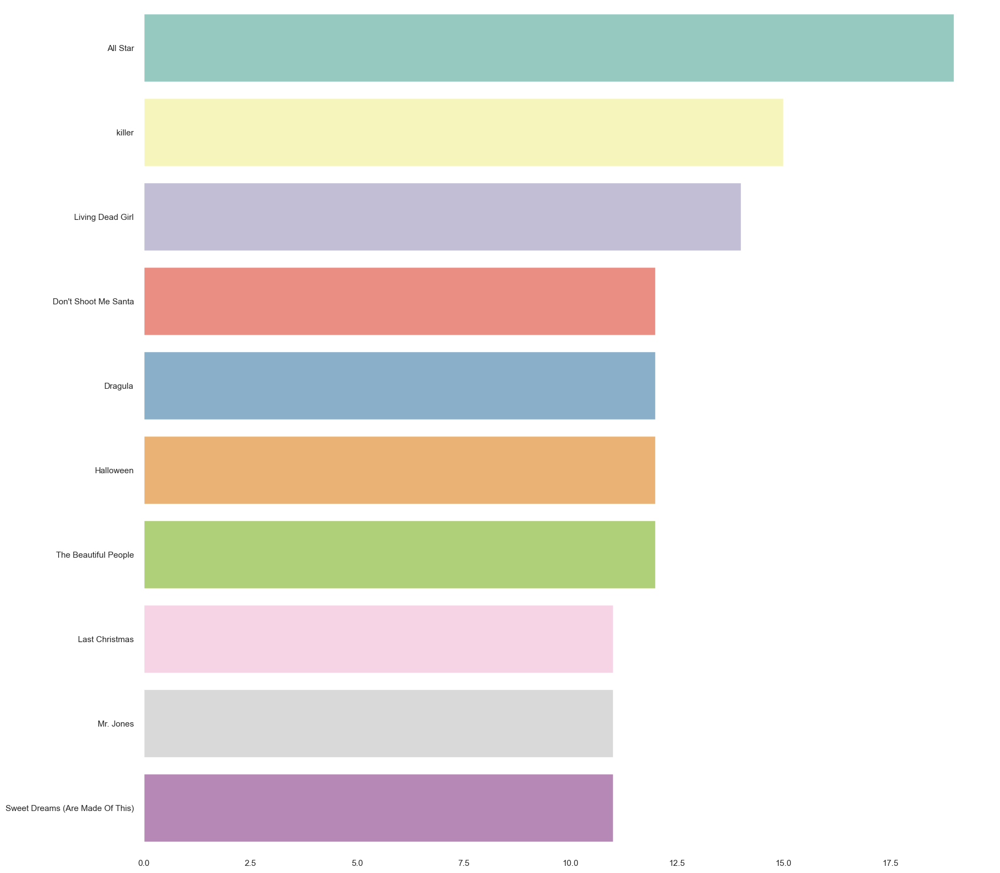

In [48]:
labels = top_ten_songs['track_name'].tolist()
counts = top_ten_songs['spotify_popularity'].tolist()

plt.figure()
sns.barplot(x=counts, y=labels, palette='Set3')
sns.despine(left=True, bottom=True)

In [49]:
#To find out how many songs does a user listen in average?

song_user = Music_data.groupby('song_id')['user_id'].count()

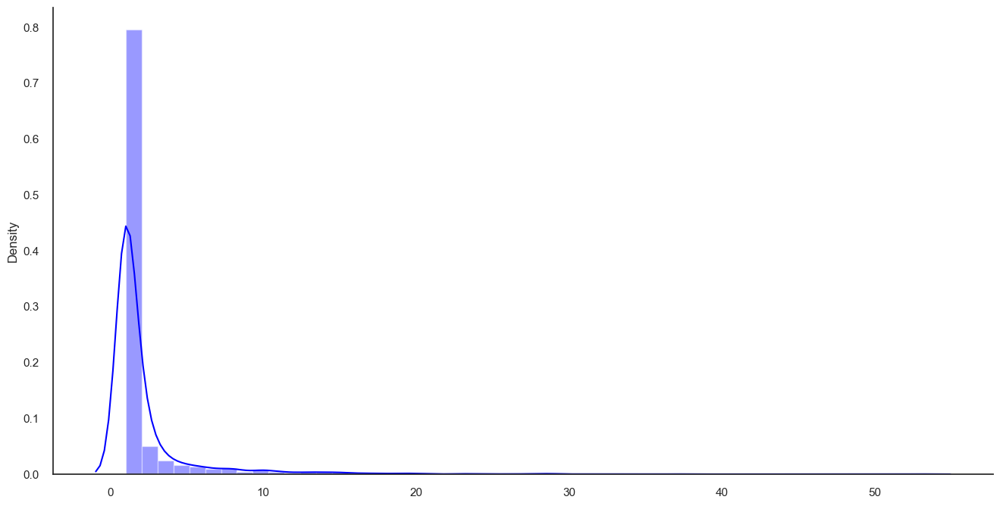

In [50]:
plt.figure(figsize=(16, 8))
sns.distplot(song_user.values, color='blue')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.show();

In [51]:
print(f"A song is listened for an average of {np.mean(song_user)} users, with minimum {np.min(song_user)} and maximum {np.max(song_user)} users.")

A song is listened for an average of 2.201321170179302 users, with minimum 1 and maximum 53 users.


# Model Building

In [52]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

In [53]:
from sklearn.metrics import accuracy_score,roc_auc_score,mean_absolute_percentage_error,mean_squared_error,mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

In [54]:
# X and y
X = Music_data[['danceability', 'energy', 'key', 'mode', 'acousticness', 'instrumentalness', 'valence', 'tempo', 'time_signature']]
y = Music_data['spotify_popularity']

In [55]:
# Split the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Model 1 : Linear Regression

In [56]:
# Create a Linear Regression model
linear_regression = LinearRegression()

# Fit the model to the training data
linear_regression.fit(X_train, y_train)
y_pred_lr = linear_regression.predict(X_test)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred_lr)

# Calculate Mean Absolute Percentage Error (MAPE)
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred_lr)

# Print the metrics
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Percentage Error (MAPE):", mape)

Mean Squared Error (MSE): 0.9529041060048986
Mean Absolute Percentage Error (MAPE): 42762.81483899972


### Q-Q Plot (Quantile-Quantile Plot)

<Figure size 800x600 with 0 Axes>

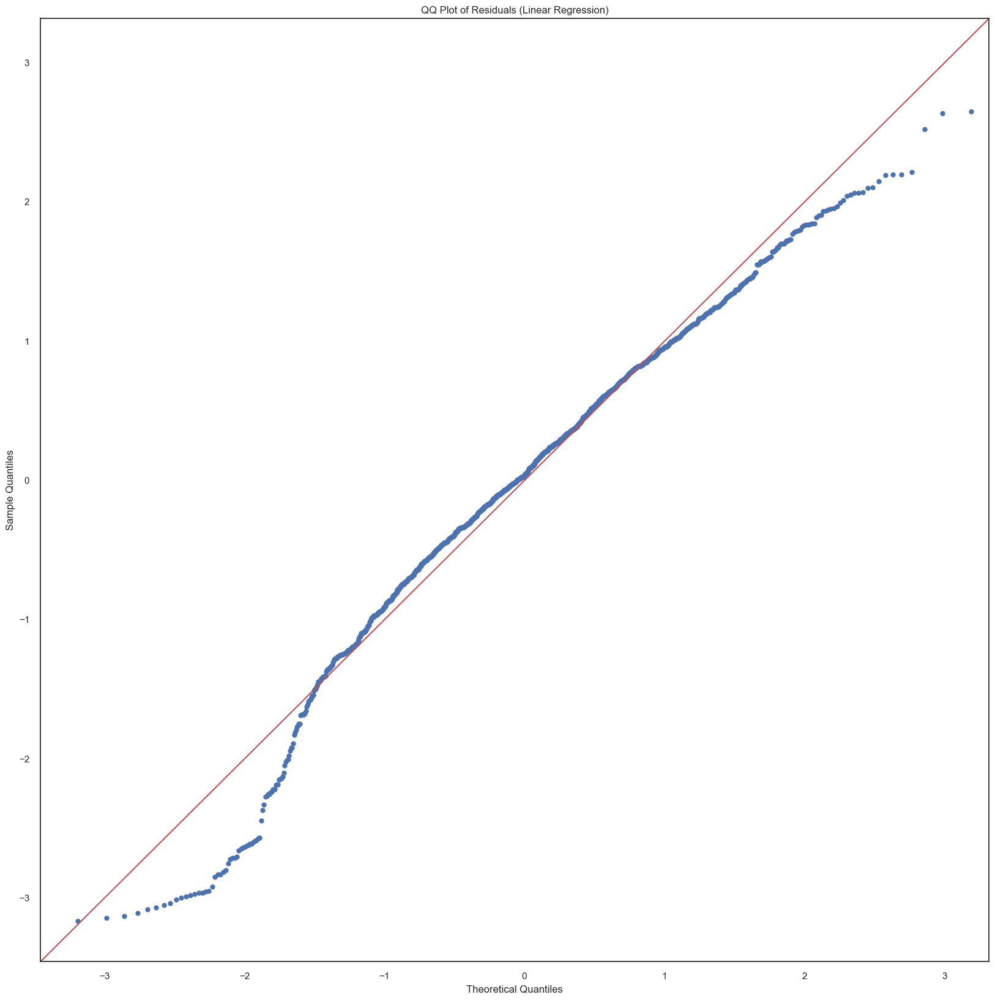

In [57]:
import statsmodels.api as sm

residuals_lr = y_test - y_pred_lr
plt.figure(figsize=(8, 6))
sm.qqplot(residuals_lr, line='45', fit=True)
plt.title("QQ Plot of Residuals (Linear Regression)")
plt.show()

## Model 2 : Random Forest Regressor

In [58]:
# RandomForestRegressor model
random_forest = RandomForestRegressor(random_state=42)
random_forest.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rf = random_forest.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred_rf)
mae = mean_absolute_error(y_test, y_pred_rf)
mape = mean_absolute_percentage_error(y_test, y_pred_rf)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("Mean Absolute Percentage Error:", mape)

Mean Squared Error: 1.061711283186876
Mean Absolute Error: 0.8000961177705082
Mean Absolute Percentage Error: 692100.6050998819


### Feature Importance Plot

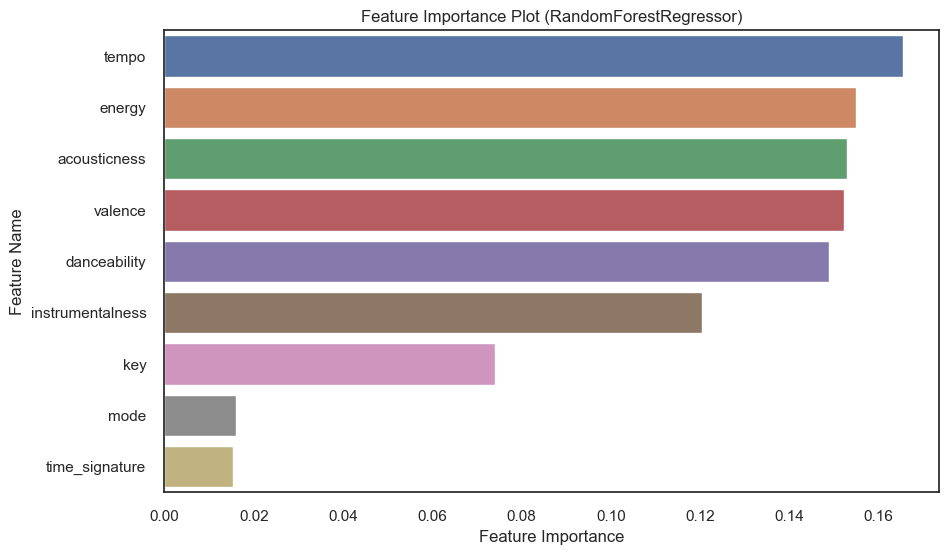

In [59]:
plt.figure(figsize=(10, 6))
feature_importance = random_forest.feature_importances_
sorted_idx = feature_importance.argsort()[::-1]
top_features = X_train.columns[sorted_idx][:10]
sns.barplot(x=feature_importance[sorted_idx][:10], y=top_features)
plt.xlabel("Feature Importance")
plt.ylabel("Feature Name")
plt.title("Feature Importance Plot (RandomForestRegressor)")
plt.show()

## Model 3 : K  Neighbour Regressor

In [60]:
# KNeighborsRegressor model
knn_regressor = KNeighborsRegressor()
knn_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_knn = knn_regressor.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred_knn)
mae = mean_absolute_error(y_test, y_pred_knn)
mape = mean_absolute_percentage_error(y_test, y_pred_knn)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("Mean Absolute Percentage Error:", mape)

Mean Squared Error: 1.1313030223149874
Mean Absolute Error: 0.8239143821498605
Mean Absolute Percentage Error: 9118094.961393878


### Residual Plot

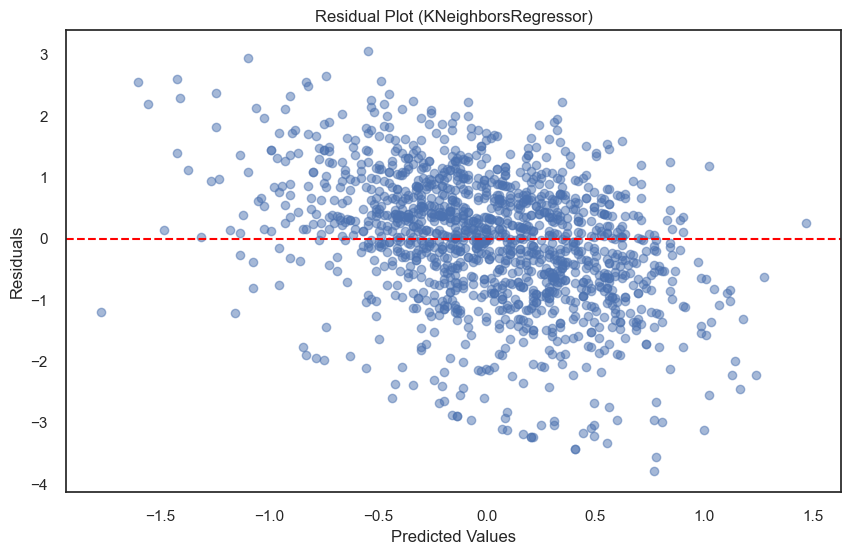

In [61]:
plt.figure(figsize=(10, 6))
residuals_knn = y_test - y_pred_knn
plt.scatter(y_pred_knn, residuals_knn, alpha=0.5)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.axhline(0, color='red', linestyle='--')
plt.title("Residual Plot (KNeighborsRegressor)")
plt.show()

## Model 4 : Decision Tree Regressor

In [62]:
# DecisionTreeRegressor model
decision_tree_regressor = DecisionTreeRegressor()
decision_tree_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_dt = decision_tree_regressor.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred_dt)
mae = mean_absolute_error(y_test, y_pred_dt)
mape = mean_absolute_percentage_error(y_test, y_pred_dt)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("Mean Absolute Percentage Error:", mape)

Mean Squared Error: 1.9093847867532563
Mean Absolute Error: 1.0790248107530065
Mean Absolute Percentage Error: 11397330.009947976


### Feature Importances: Visualize the importance of each feature in the decision tree.

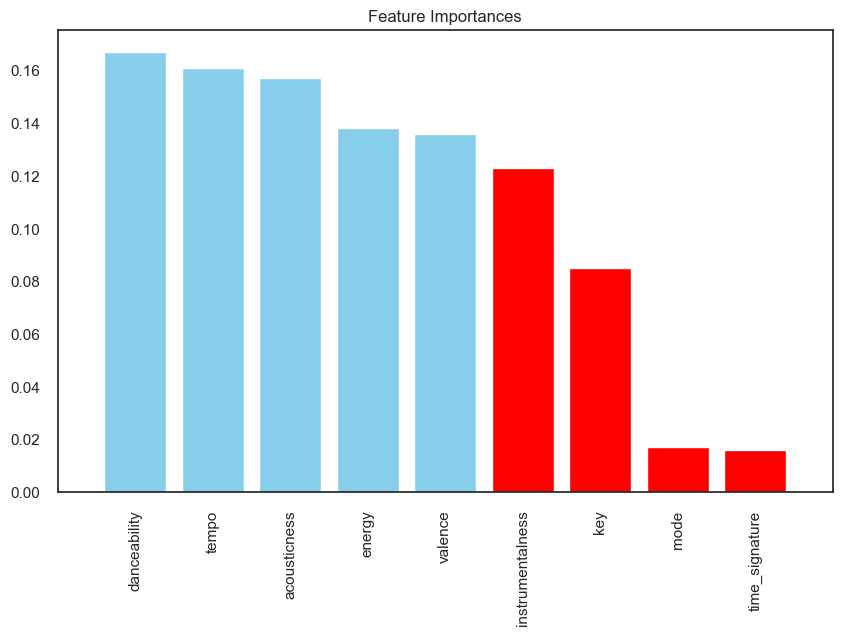

In [63]:
importances = decision_tree_regressor.feature_importances_
indices = np.argsort(importances)[::-1]

colors = ['skyblue' if i < 5 else 'red' for i in range(X.shape[1])]
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(X.shape[1]), importances[indices], align="center", color=colors)
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

## Model 5 : XGB Regressor

In [64]:
# XGBRegressor model
xgb_regressor = XGBRegressor()
xgb_regressor.fit(X_train, y_train)

# Make predictions on the test set
y_pred_xgb = xgb_regressor.predict(X_test)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred_xgb)
mae = mean_absolute_error(y_test, y_pred_xgb)
mape = mean_absolute_percentage_error(y_test, y_pred_xgb)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("Mean Absolute Percentage Error:", mape)

Mean Squared Error: 1.1491712477813893
Mean Absolute Error: 0.8311533711594499
Mean Absolute Percentage Error: 1999235.1559749127


## Actual vs. Predicted Values (Colored by Residuals)

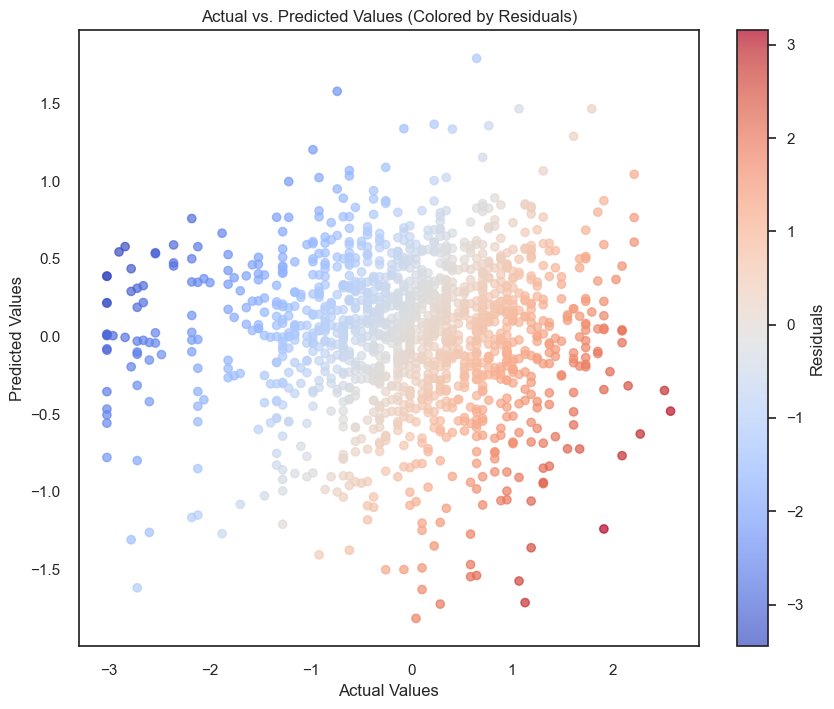

In [65]:
residuals = y_test - y_pred_xgb
color_map = plt.get_cmap('coolwarm', len(residuals))

plt.figure(figsize=(10, 8))
plt.scatter(y_test, y_pred_xgb, c=residuals, cmap=color_map, alpha=0.7)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values (Colored by Residuals)")
cbar = plt.colorbar()
cbar.set_label("Residuals")
plt.show()

## Final Model To Recommend Top 10 Songs For Users

## User and Genre recommendation

In [66]:
# Importing Libraries
import math
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split

In [67]:
# Remove Duplicate Entries:
Music_data.drop_duplicates(subset=['user_id', 'song_id'], inplace=True)
user_item_matrix =Music_data.pivot(index='user_id', columns='song_id', values='Rating').fillna(0)

In [80]:
# Create User-Item Matrix
user_item_matrix = Music_data.pivot(index='user_id', columns='song_id', values='Rating').fillna(0)

In [69]:
# Aggregate Duplicate Entries:
user_item_matrix = Music_data.groupby(['user_id', 'song_id'])['Rating'].mean().unstack().fillna(0)

In [79]:
user_item_matrix

song_id,0,1,2,3,4,5,6,7,8,9,...,3169,3170,3171,3172,3173,3174,3175,3176,3177,3178
user_id,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
662,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
663,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [70]:
# Calculate Similarity Matrix
user_similarity = cosine_similarity(user_item_matrix)
user_similarity

array([[1.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 1.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 1.       , ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 0.       , ..., 1.       , 0.4730295,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.4730295, 1.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        1.       ]])

In [71]:
user_sim_df = pd.DataFrame(user_similarity)

In [72]:
user_sim_df

,0,1,2,3,4,5,6,7,8,9,...,656,657,658,659,660,661,662,663,664,665
0,1.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.0,1.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.0,0.0,1.000000,0.0,0.086789,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.0,0.0,0.086789,0.0,1.000000,0.0,0.0,0.000000,0.0,0.0,...,0.057577,0.041677,0.000000,0.000000,0.036188,0.000000,0.000000,0.000000,0.000000,0.069271
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
661,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.040029,0.0,0.0,...,0.105727,0.051450,0.037050,0.105837,0.119661,1.000000,0.229259,0.176441,0.186501,0.000000
662,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.084938,0.0,0.0,...,0.307483,0.171946,0.204404,0.286859,0.308078,0.229259,1.000000,0.804424,0.311645,0.000000
663,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.254388,0.234889,0.152741,0.261302,0.262585,0.176441,0.804424,1.000000,0.473029,0.000000
664,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.133388,0.137934,0.000000,0.161416,0.222425,0.186501,0.311645,0.473029,1.000000,0.000000


In [82]:
#Most Similar Users

print(user_sim_df.idxmax(axis=1))
print(user_sim_df.max(axis=1).sort_values(ascending=False))

0        0
1        1
2        2
3        3
4        4
      ... 
661    661
662    662
663    663
664    664
665    665
Length: 666, dtype: int64
618    1.0
114    1.0
12     1.0
383    1.0
113    1.0
      ... 
409    1.0
517    1.0
24     1.0
97     1.0
492    1.0
Length: 666, dtype: float64


In [74]:
#Set the index and column names to user ids

unique_user_ids = Music_data['user_id'].unique()
print("Unique User IDs in the Dataset:", unique_user_ids)

Unique User IDs in the Dataset: [ 12  13  20  21  22  23  16  19  24  26  25  18  27  28  29  30  31  32
  34  10  35  36  37  38  39   0  40  41  42  44  14  11  45  47  43  48
  49  51  52  53  54  50  55   3  56  57  58  59  60  61  62  63  15  64
  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82
  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  46  98  99
 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 136
 137 135 138 139 140 141 142 144 143 145 146 147 149 150 151 148 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 172
 173 174 171 175 176 177 178 179 180 181   2 182 665 183 184 185 186 187
 188 190 191 192 193 189 194 195 196 197 198 199 200 201 202 203 204 205
 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223
 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241
 242 243 244 245 24

## User similarity vector to all other users

In [75]:
def recommend_songs(user_id, user_item_matrix, user_similarity, track_genre, Music_data, num_recommendations=10):
    # Get the user's similarity vector to all other users
    user_similarities = user_similarity[user_id]

    # Find the users most similar to the target user
    similar_users = np.argsort(user_similarities)[::-1]

    recommendations = []

    for user in similar_users:
        if user == user_id:
            continue

        similar_user_ratings = user_item_matrix.loc[user]
        genre_condition = (Music_data['track_genre'] == track_genre) & (similar_user_ratings > 0)
        genre_songs = similar_user_ratings[genre_condition]
  
 # Exclude songs already rated by the target user
        unrated_songs = genre_songs[~genre_songs.index.isin(user_item_matrix.columns[user_item_matrix.loc[user_id] > 0])]

        # Add the unrated songs along with their ratings to recommendations
        for song_id, rating in unrated_songs.items():
            recommendations.append((song_id, rating))

        top_recommendations = sorted(recommendations, key=lambda x: x[1], reverse=True)[:num_recommendations]

    # Extract the song names corresponding to the song IDs
    recommended_songs = [(Music_data[Music_data['song_id'] == song_id]['track_name'].values[0], rating) for song_id, rating in top_recommendations]

    return recommended_songs

### Recommended songs for Users

In [87]:
user_id_to_recommend = 117
track_genre_to_recommend = 'acoustic'

recommended_tracks = recommend_songs(user_id_to_recommend, user_item_matrix, user_similarity, track_genre_to_recommend, Music_data, num_recommendations=10)

print("Recommended songs for User {} in the {} genre:".format(user_id_to_recommend, track_genre_to_recommend))
print('=================================================================================================================')
for i, (track_name, rating) in enumerate(recommended_tracks, start=1):
    print("{}. {}, Rating:  {}".format(i, track_name, rating))


Recommended songs for User 117 in the acoustic genre:
1. Mujer con Abanico, Rating:  5.0
2. Fallen Star, Rating:  5.0
3. Bouncing Bona, Rating:  5.0
4. そういえば今日から化け物になった, Rating:  5.0
5. 2002 - Acoustic, Rating:  5.0
6. death bed (coffee for your head), Rating:  5.0
7. My Baby's Cheating - I Sure Got the Feeling, Rating:  5.0
8. death bed (coffee for your head), Rating:  5.0
9. Disco Ball, Rating:  5.0
10. Ghost - Acoustic, Rating:  5.0
